In [1]:
import pandas as pd 
import re
import matplotlib.pyplot as plt 
from wordcloud import WordCloud 
import seaborn as sns 
from collections import Counter 
from sklearn.feature_extraction.text import CountVectorizer 
import nltk
from nltk.corpus import stopwords 
from nltk import bigrams 
from nltk. sentiment.vader import SentimentIntensityAnalyzer

In [2]:
import pandas as pd

# 加载CSV数据文件
file_path = 'tweets.csv'
tweets = pd.read_csv(file_path)

# 查看前五行数据
print(tweets.head())

                   id          handle  \
0  780925634159796224  HillaryClinton   
1  780916180899037184  HillaryClinton   
2  780911564857761793  HillaryClinton   
3  780907038650068994  HillaryClinton   
4  780897419462602752  HillaryClinton   

                                                text  is_retweet  \
0  The question in this election: Who can put the...       False   
1  Last night, Donald Trump said not paying taxes...        True   
2  Couldn't be more proud of @HillaryClinton. Her...        True   
3  If we stand together, there's nothing we can't...       False   
4  Both candidates were asked about how they'd co...       False   

  original_author                 time in_reply_to_screen_name  \
0             NaN  2016-09-28T00:22:34                     NaN   
1        timkaine  2016-09-27T23:45:00                     NaN   
2           POTUS  2016-09-27T23:26:40                     NaN   
3             NaN  2016-09-27T23:08:41                     NaN   
4             

In [3]:
tweets.columns

Index(['id', 'handle', 'text', 'is_retweet', 'original_author', 'time',
       'in_reply_to_screen_name', 'in_reply_to_status_id',
       'in_reply_to_user_id', 'is_quote_status', 'lang', 'retweet_count',
       'favorite_count', 'longitude', 'latitude', 'place_id',
       'place_full_name', 'place_name', 'place_type', 'place_country_code',
       'place_country', 'place_contained_within', 'place_attributes',
       'place_bounding_box', 'source_url', 'truncated', 'entities',
       'extended_entities'],
      dtype='object')

In [4]:
tweets['time'] = pd.to_datetime(tweets['time'])

In [5]:
tweets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6444 entries, 0 to 6443
Data columns (total 28 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   id                       6444 non-null   int64         
 1   handle                   6444 non-null   object        
 2   text                     6444 non-null   object        
 3   is_retweet               6444 non-null   bool          
 4   original_author          722 non-null    object        
 5   time                     6444 non-null   datetime64[ns]
 6   in_reply_to_screen_name  208 non-null    object        
 7   in_reply_to_status_id    202 non-null    float64       
 8   in_reply_to_user_id      208 non-null    float64       
 9   is_quote_status          6444 non-null   bool          
 10  lang                     6444 non-null   object        
 11  retweet_count            6444 non-null   int64         
 12  favorite_count           6444 non-

In [6]:
tweets.lang.value_counts()

en     6248
es      105
und      82
da        3
fr        2
tl        2
et        1
fi        1
Name: lang, dtype: int64

In [7]:
tweets = tweets[tweets['lang']=='en']
tweets.lang.value_counts()

en    6248
Name: lang, dtype: int64

In [8]:
def clean_text(text):
    """
    Clean the text by performing the following steps:
    1. Remove URLs as they do not contribute to the semantic meaning.
    2. Remove HTML entities (e.g., &amp, &lt) that are artifacts.
    3. Remove non-alphabetic characters (e.g., numbers, punctuation).
    4. Remove emojis that may introduce noise and are not part of the core sentiment.
    5. Convert all text to lowercase to standardize the text format.
    6. Remove extra spaces and new line characters for better word separation.
    """
    # Remove URLs
    text = re.sub(r'http\S+|www\S+', '', text)
    # Remove HTML entities
    text = re.sub(r'&[a-z]+;', '', text)
    # Remove non-alphabetic characters
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    # Convert text to lowercase
    text = text.lower()
    # Remove extra spaces and newline characters
    text = re.sub(r'\s+', ' ', text).strip()
    return text

# Apply the clean_text function to your dataset's text column
# Assuming 'tweets' is your dataframe and 'text' is the column containing the tweets
tweets['cleaned_text'] = tweets['text'].apply(clean_text)

# Check the cleaned text
print(tweets['cleaned_text'].head())

0    the question in this election who can put the ...
1    last night donald trump said not paying taxes ...
2    couldnt be more proud of hillaryclinton her vi...
3    if we stand together theres nothing we cant do...
4    both candidates were asked about how theyd con...
Name: cleaned_text, dtype: object


In [9]:
tweets.to_csv('clean_tweets.csv', index=False)

In [10]:
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from collections import Counter
import spacy

# Download necessary resources for NLTK and spacy
nltk.download('punkt')
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
nlp = spacy.load('en_core_web_sm')

# Clean and preprocess text (with Tokenization and Lemmatization)
def preprocess_text(text):
    # Clean text (similar to the previous function)
    text = re.sub(r'http\S+|www\S+', '', text)  # Remove URLs
    text = re.sub(r'&[a-z]+;', '', text)  # Remove HTML entities
    text = re.sub(r'[^a-zA-Z\s]', '', text)  # Remove non-alphabetic characters
    text = text.lower().strip()  # Convert to lowercase and strip spaces
    
    # Tokenization and remove stopwords
    tokens = word_tokenize(text)
    tokens = [token for token in tokens if token not in stop_words]
    
    # Lemmatization using spacy
    doc = nlp(' '.join(tokens))
    lemmas = [token.lemma_ for token in doc]
    return lemmas

# Example to apply this function to a specific user's tweets (Trump or Hillary)
tweets['processed_text'] = tweets['text'].apply(preprocess_text)
print(tweets['processed_text'].head())

[nltk_data] Downloading package punkt to /Users/yukiding/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/yukiding/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


0    [question, election, put, plan, action, make, ...
1    [last, night, donald, trump, say, pay, taxis, ...
2    [could, not, proud, hillaryclinton, vision, co...
3    [stand, together, there, s, nothing, can, not,...
4    [candidate, ask, they, d, confront, racial, in...
Name: processed_text, dtype: object


Trump's most common words:


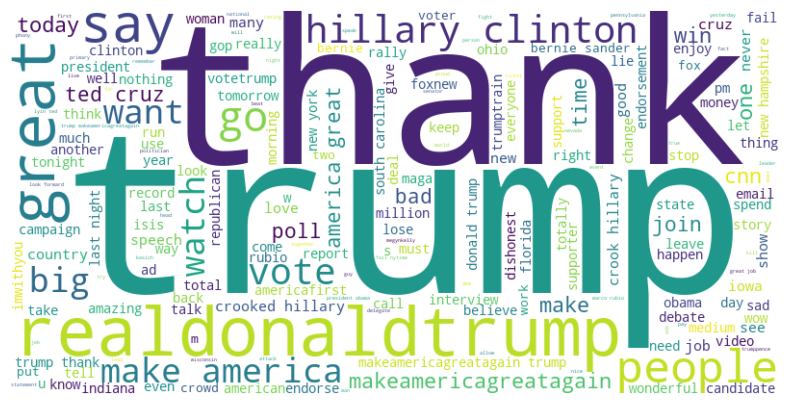

Hillary's most common words:


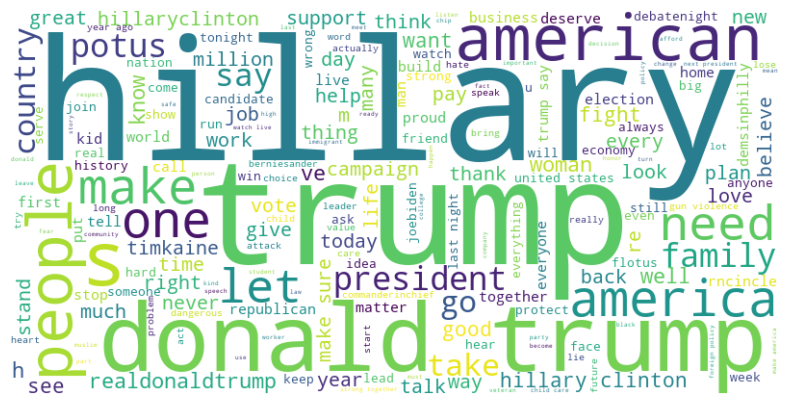

In [11]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Function to generate word cloud
def generate_word_cloud(words):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(words))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

# Combine all processed words for Trump or Hillary's tweets
trump_words = [word for tokens in tweets[tweets['handle'] == 'realDonaldTrump']['processed_text'] for word in tokens]
hillary_words = [word for tokens in tweets[tweets['handle'] == 'HillaryClinton']['processed_text'] for word in tokens]

# Display word cloud for both
print("Trump's most common words:")
generate_word_cloud(trump_words)

print("Hillary's most common words:")
generate_word_cloud(hillary_words)

Trump's most common words:


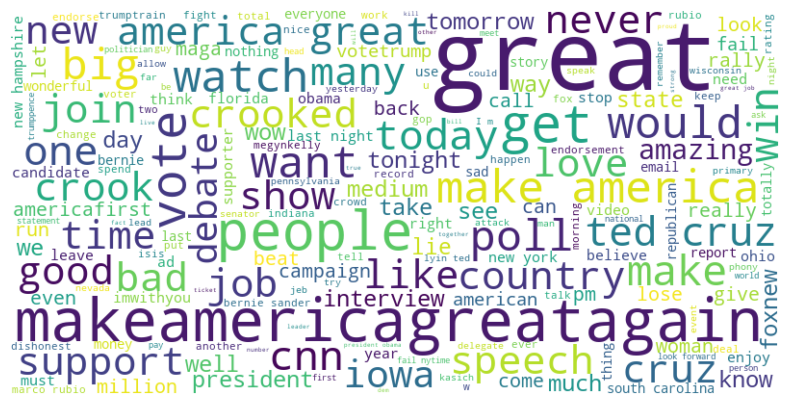

Hillary's most common words:


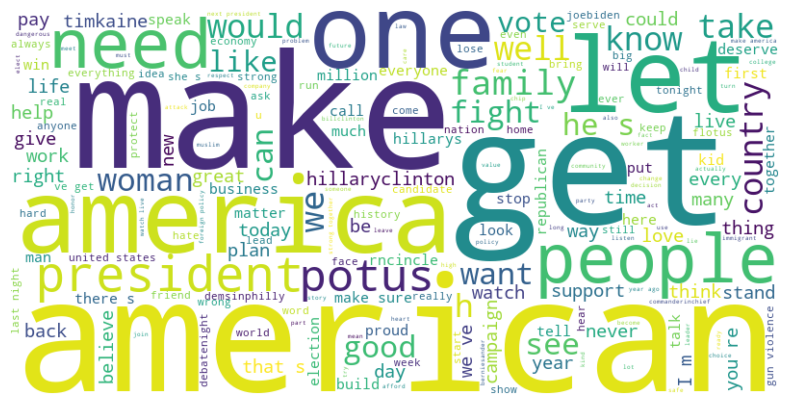

In [12]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# 要移除的单词
custom_stopwords = {'thank', 'trump', 'realdonaldtrump', 'hillary', 'go', 'clinton','donald','do','not','say'}

# Function to generate word cloud
def generate_word_cloud(words):
    wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=custom_stopwords).generate(' '.join(words))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

# Combine all processed words for Trump or Hillary's tweets
trump_words = [word for tokens in tweets[tweets['handle'] == 'realDonaldTrump']['processed_text'] for word in tokens]
hillary_words = [word for tokens in tweets[tweets['handle'] == 'HillaryClinton']['processed_text'] for word in tokens]

# Display word cloud for both
print("Trump's most common words:")
generate_word_cloud(trump_words)

print("Hillary's most common words:")
generate_word_cloud(hillary_words)

In [13]:
# 替换 "america" 为 "american"
tweets['processed_text'] = tweets['processed_text'].apply(lambda x: [word.replace('america', 'american') for word in x])

# 之后再生成词云

Trump's most common words:


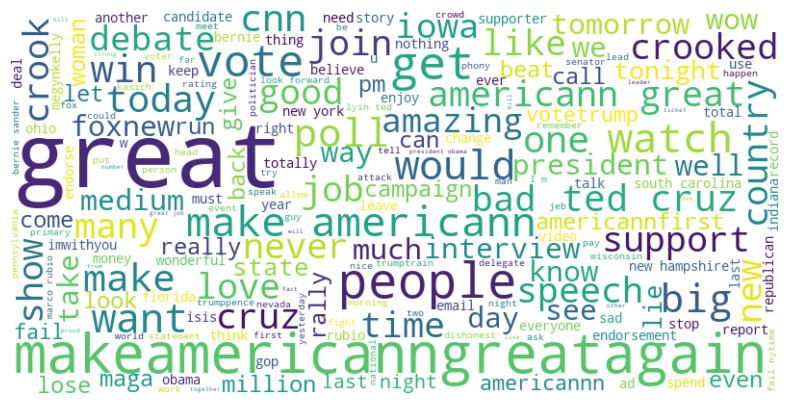

Hillary's most common words:


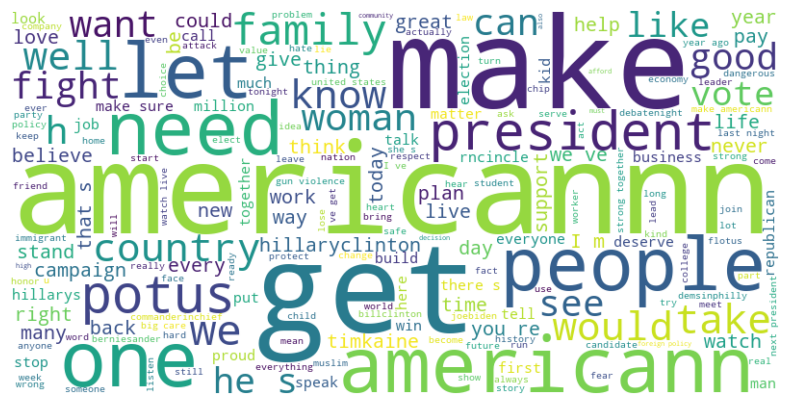

In [14]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# 要移除的单词
custom_stopwords = {'thank', 'trump', 'realdonaldtrump', 'hillary', 'go', 'clinton','donald','do','not','say'}

# Function to generate word cloud
def generate_word_cloud(words):
    wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=custom_stopwords).generate(' '.join(words))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

# 替换 "america" 为 "american"
tweets['processed_text'] = tweets['processed_text'].apply(lambda x: [word.replace('america', 'american') for word in x])

# Combine all processed words for Trump or Hillary's tweets
trump_words = [word for tokens in tweets[tweets['handle'] == 'realDonaldTrump']['processed_text'] for word in tokens]
hillary_words = [word for tokens in tweets[tweets['handle'] == 'HillaryClinton']['processed_text'] for word in tokens]

# Display word cloud for both
print("Trump's most common words:")
generate_word_cloud(trump_words)

print("Hillary's most common words:")
generate_word_cloud(hillary_words)


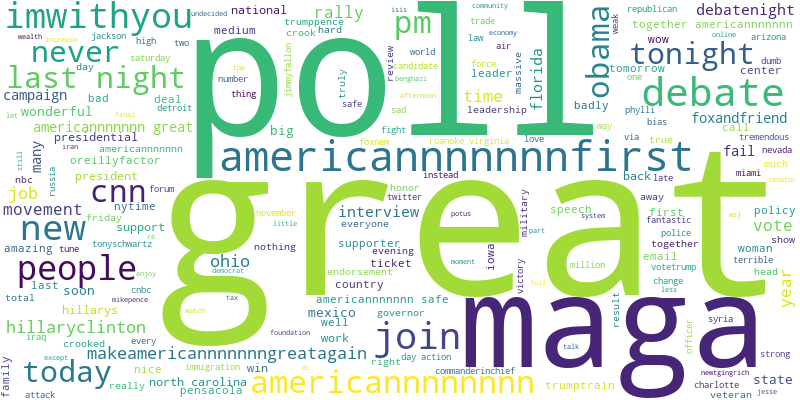
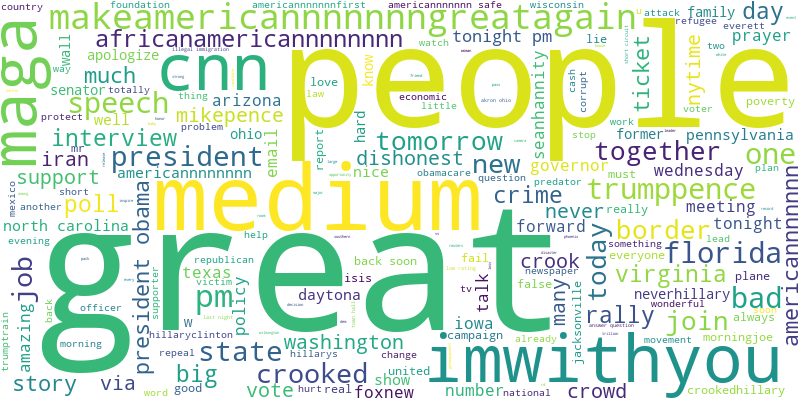
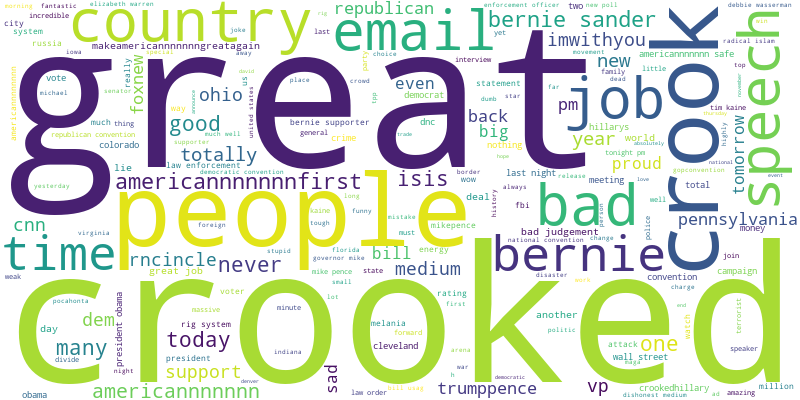
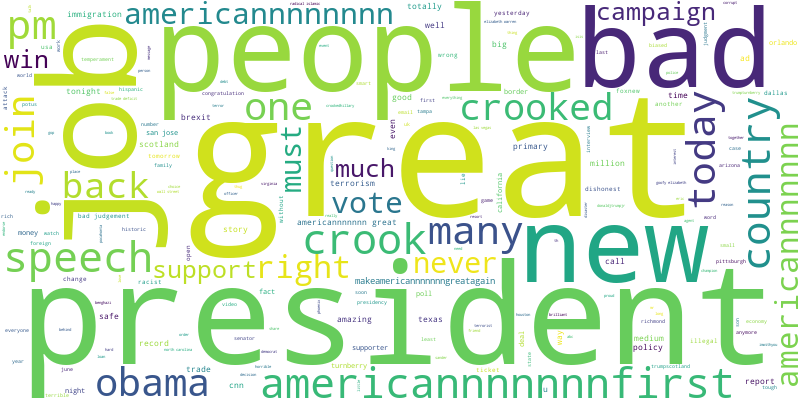
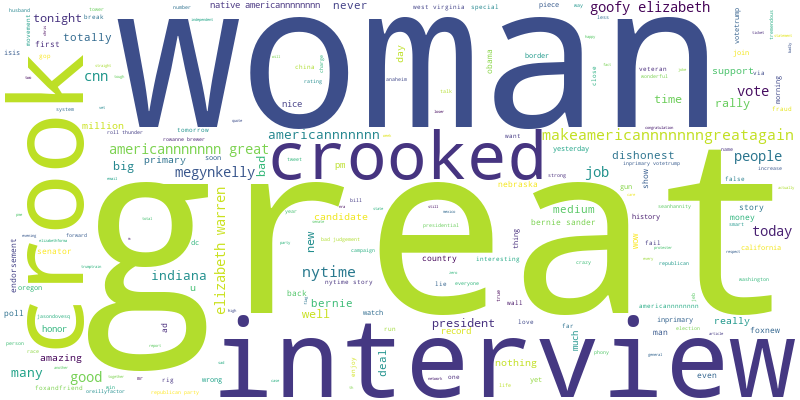
...
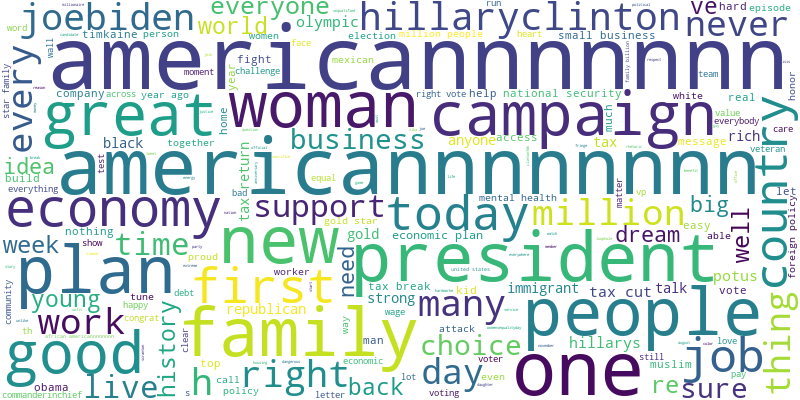
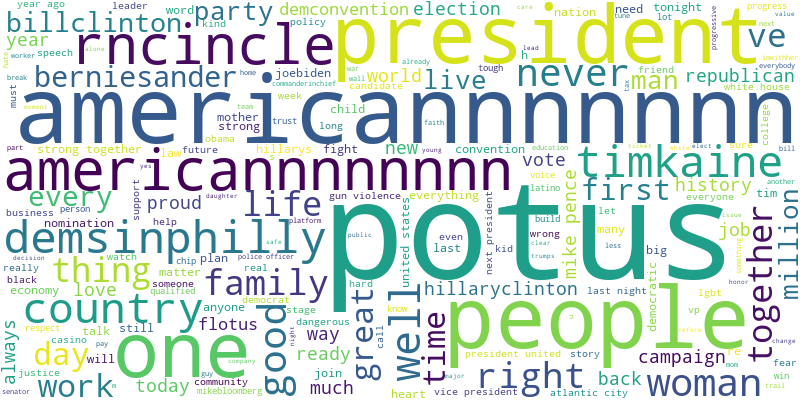
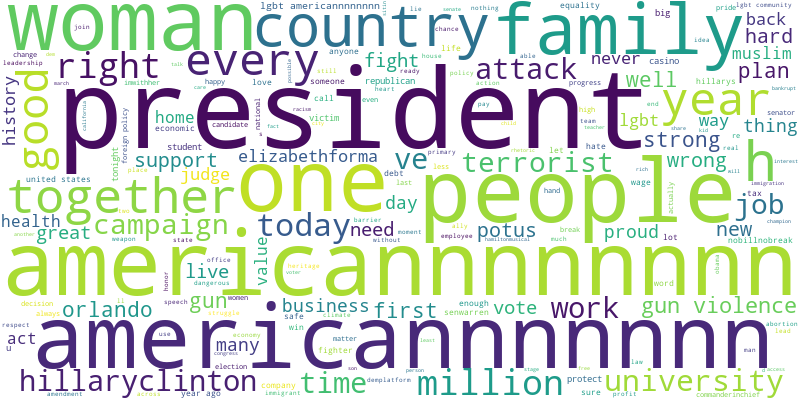
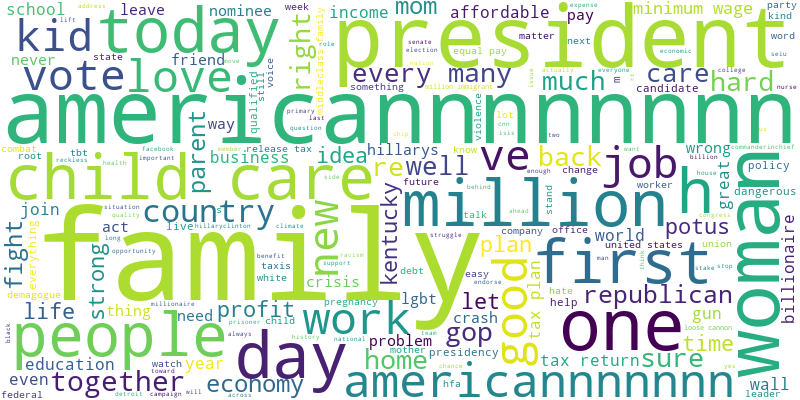
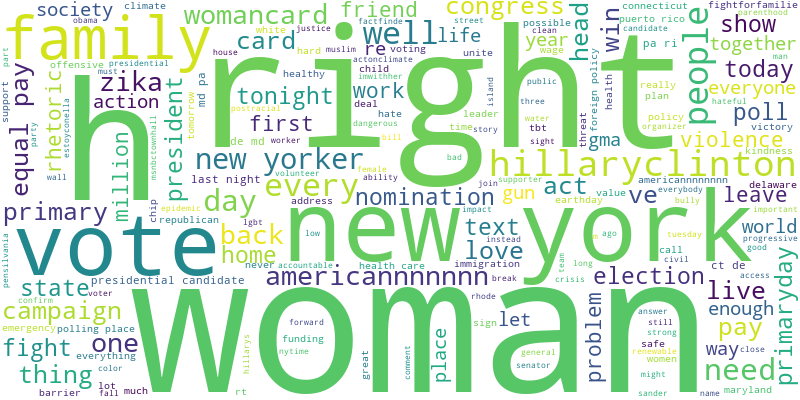

In [22]:
import spacy
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import os
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import base64

# 加载spaCy的模型
nlp = spacy.load('en_core_web_sm')

# 要移除的单词
custom_stopwords = {'thank', 'trump', 'realdonaldtrump', 'hillary', 'go', 'clinton', 'donald', 'do', 'not', 'say'}

# Function to process text and remove verbs
def remove_verbs_and_stopwords(text):
    doc = nlp(' '.join(text))  # 使用 spaCy 进行词性标注
    filtered_tokens = [token.text for token in doc if token.pos_ != 'VERB' and token.text.lower() not in custom_stopwords]
    return filtered_tokens

# 应用函数以移除动词和自定义停用词
tweets['processed_text'] = tweets['processed_text'].apply(remove_verbs_and_stopwords)

# 确保输出图片文件夹
output_dir = "wordclouds_by_month"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# 生成词云的函数并保存图像
def generate_word_cloud(words, month, candidate, time_section):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(words))
    file_path = f"{output_dir}/{candidate}_{month}_{time_section}.png"
    wordcloud.to_file(file_path)
    return file_path

# 确保日期列是datetime格式
tweets['time'] = pd.to_datetime(tweets['time'])

# 按照人物和时间段分割
time_sections = ["early", "mid", "late"]

# 分别处理Trump和Hillary的数据
for candidate in ['realDonaldTrump', 'HillaryClinton']:
    images_paths = []
    time_labels = []
    
    candidate_data = tweets[tweets['handle'] == candidate]

    # 将数据按时间段划分为三份
    months = candidate_data['time'].dt.to_period('M').unique().tolist()
    split_indices = [len(months)//3, 2*len(months)//3]  # 将月份均匀分为三段

    for i, (start, end) in enumerate([(0, split_indices[0]), (split_indices[0], split_indices[1]), (split_indices[1], len(months))]):
        subset = months[start:end]
        
        for month in subset:
            words = [word for tokens in candidate_data[candidate_data['time'].dt.to_period('M') == month]['processed_text'] for word in tokens]

            if words:
                file_path = generate_word_cloud(words, month, candidate, time_sections[i])
                images_paths.append(file_path)
                time_labels.append(f"{candidate} - {month} ({time_sections[i]})")

    # 将图片编码为 Base64
    def image_to_base64(image_path):
        with open(image_path, 'rb') as f:
            encoded_image = base64.b64encode(f.read()).decode('utf-8')
        return "data:image/png;base64," + encoded_image

    # 创建带时间轴的交互式图像
    fig = make_subplots(rows=1, cols=1)

    # 添加图片的滑动条
    steps = []
    for i, file_path in enumerate(images_paths):
        image_base64 = image_to_base64(file_path)
        fig.add_trace(
            go.Image(source=image_base64, name=time_labels[i]),
        )
        step = dict(
            method="update",
            args=[{"visible": [False] * len(images_paths)}, {"title": time_labels[i]}],
        )
        step["args"][0]["visible"][i] = True
        steps.append(step)

    # 创建滑动条
    sliders = [dict(
        active=0,
        currentvalue={"prefix": f"{candidate} - Time Section: "},
        pad={"t": 50},
        steps=steps
    )]

    # 更新布局
    fig.update_layout(
        sliders=sliders,
        title=f"{candidate} Word Cloud Over Time",
    )

    # 显示交互图
    fig.show()

/var/folders/5h/b_ycf6fd2hx4kqysgjh3ly_80000gn/T/ipykernel_51958/3242946874.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trump_tweets['time'] = pd.to_datetime(trump_tweets['time'])
/var/folders/5h/b_ycf6fd2hx4kqysgjh3ly_80000gn/T/ipykernel_51958/3242946874.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hillary_tweets['time'] = pd.to_datetime(hillary_tweets['time'])


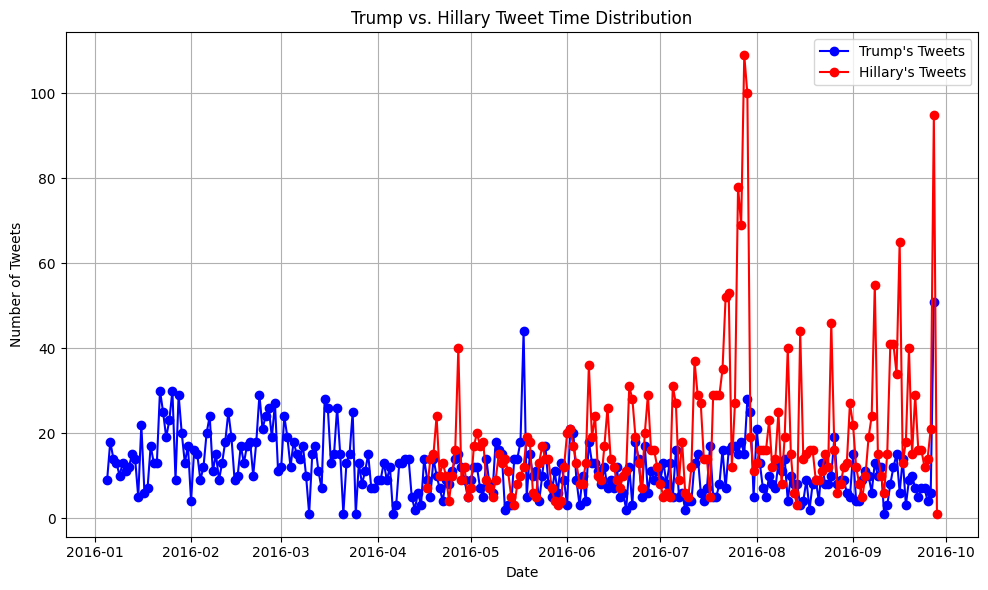

In [23]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter data for Trump and Hillary
trump_tweets = tweets[tweets['handle'] == 'realDonaldTrump']
hillary_tweets = tweets[tweets['handle'] == 'HillaryClinton']

# Convert 'time' to datetime format
trump_tweets['time'] = pd.to_datetime(trump_tweets['time'])
hillary_tweets['time'] = pd.to_datetime(hillary_tweets['time'])

# Resample tweets to daily counts
trump_time_series = trump_tweets.set_index('time').resample('D').size()
hillary_time_series = hillary_tweets.set_index('time').resample('D').size()

# Plot time distribution as a line plot
plt.figure(figsize=(10, 6))

# Plot Trump's and Hillary's tweets over time
plt.plot(trump_time_series.index, trump_time_series.values, label="Trump's Tweets", color='blue', marker='o')
plt.plot(hillary_time_series.index, hillary_time_series.values, label="Hillary's Tweets", color='red', marker='o')

# Add labels and title
plt.title('Trump vs. Hillary Tweet Time Distribution')
plt.xlabel('Date')
plt.ylabel('Number of Tweets')
plt.legend()
plt.grid(True)

# Show plot
plt.tight_layout()
plt.show()

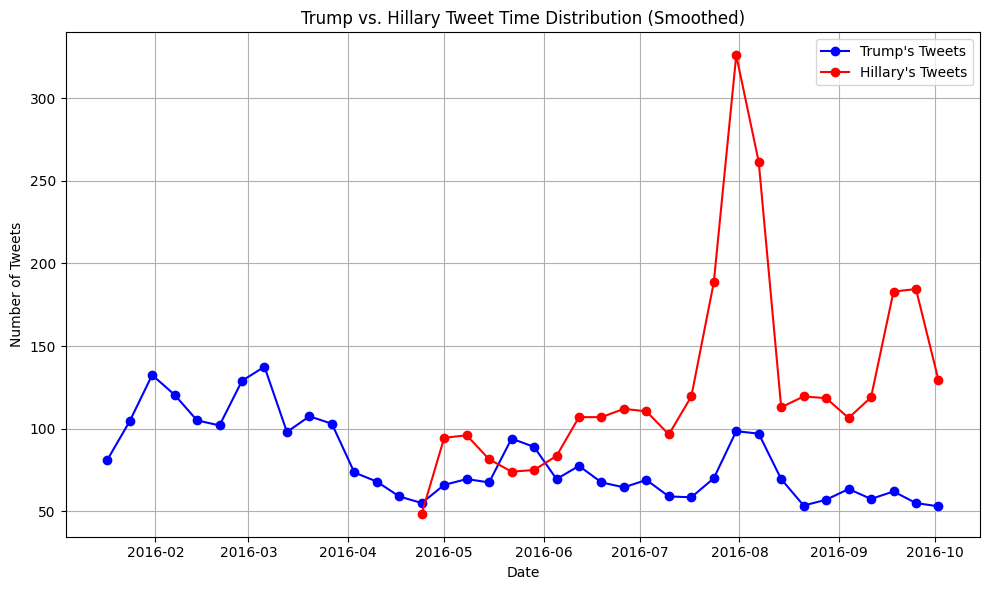

In [24]:

# Resample tweets to weekly counts and apply rolling average to smooth the data
trump_time_series = trump_tweets.set_index('time').resample('W').size().rolling(window=2).mean()
hillary_time_series = hillary_tweets.set_index('time').resample('W').size().rolling(window=2).mean()

# Plot time distribution as a line plot
plt.figure(figsize=(10, 6))

# Plot Trump's and Hillary's tweets over time
plt.plot(trump_time_series.index, trump_time_series.values, label="Trump's Tweets", color='blue', marker='o')
plt.plot(hillary_time_series.index, hillary_time_series.values, label="Hillary's Tweets", color='red', marker='o')

# Add labels and title
plt.title('Trump vs. Hillary Tweet Time Distribution (Smoothed)')
plt.xlabel('Date')
plt.ylabel('Number of Tweets')
plt.legend()
plt.grid(True)

# Show plot
plt.tight_layout()
plt.show()

In [45]:
import plotly.graph_objects as go

# Resample tweets to weekly counts and apply rolling average to smooth the data
trump_time_series = trump_tweets.set_index('time').resample('W').size().rolling(window=2).mean()
hillary_time_series = hillary_tweets.set_index('time').resample('W').size().rolling(window=2).mean()

# 创建交互式折线图
fig = go.Figure()

# 添加特朗普推文数据的折线图
fig.add_trace(go.Scatter(
    x=trump_time_series.index, 
    y=trump_time_series.values,
    mode='lines+markers',
    name="Trump's Tweets",
    line=dict(color='blue'),
    marker=dict(color='blue')
))

# 添加希拉里推文数据的折线图
fig.add_trace(go.Scatter(
    x=hillary_time_series.index, 
    y=hillary_time_series.values,
    mode='lines+markers',
    name="Hillary's Tweets",
    line=dict(color='red'),
    marker=dict(color='red')
))

# 设置图表的布局
fig.update_layout(
    title='Trump vs. Hillary Tweet Time Distribution (Smoothed)',
    xaxis_title='Date',
    yaxis_title='Number of Tweets',
    legend_title='Candidates',
    hovermode='x unified'
)

# 显示交互式图表
fig.show()

In [33]:
from transformers import pipeline

# 加载预训练的 GoEmotions 模型
emotion_classifier = pipeline("text-classification", model="bhadresh-savani/distilbert-base-uncased-emotion", return_all_scores=True)

# 定义函数来对每个推文进行详细情感分析
def analyze_emotions(text):
    results = emotion_classifier(text)
    emotions = {result['label']: result['score'] for result in results[0]}
    return emotions

# 对特朗普的推文进行情感分析
trump_tweets = tweets[tweets['handle'] == 'realDonaldTrump']['text']
trump_emotions = trump_tweets.apply(analyze_emotions)

# 对希拉里的推文进行情感分析
hillary_tweets = tweets[tweets['handle'] == 'HillaryClinton']['text']
hillary_emotions = hillary_tweets.apply(analyze_emotions)

# 查看特朗普推文的情感分析结果
print("Trump's emotions analysis:")
print(trump_emotions.head())

# 查看希拉里推文的情感分析结果
print("Hillary's emotions analysis:")
print(hillary_emotions.head())

All PyTorch model weights were used when initializing TFDistilBertForSequenceClassification.

All the weights of TFDistilBertForSequenceClassification were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertForSequenceClassification for predictions without further training.


Trump's emotions analysis:
5     {'sadness': 0.017600174993276596, 'joy': 0.542...
8     {'sadness': 0.01908617652952671, 'joy': 0.6929...
11    {'sadness': 0.001269252272322774, 'joy': 0.992...
12    {'sadness': 0.017756324261426926, 'joy': 0.003...
13    {'sadness': 0.008475430309772491, 'joy': 0.895...
Name: text, dtype: object
Hillary's emotions analysis:
0    {'sadness': 0.007915246300399303, 'joy': 0.966...
1    {'sadness': 0.018286917358636856, 'joy': 0.062...
2    {'sadness': 0.0011994005180895329, 'joy': 0.99...
3    {'sadness': 0.00046656414633616805, 'joy': 0.9...
4    {'sadness': 0.01564955897629261, 'joy': 0.0224...
Name: text, dtype: object


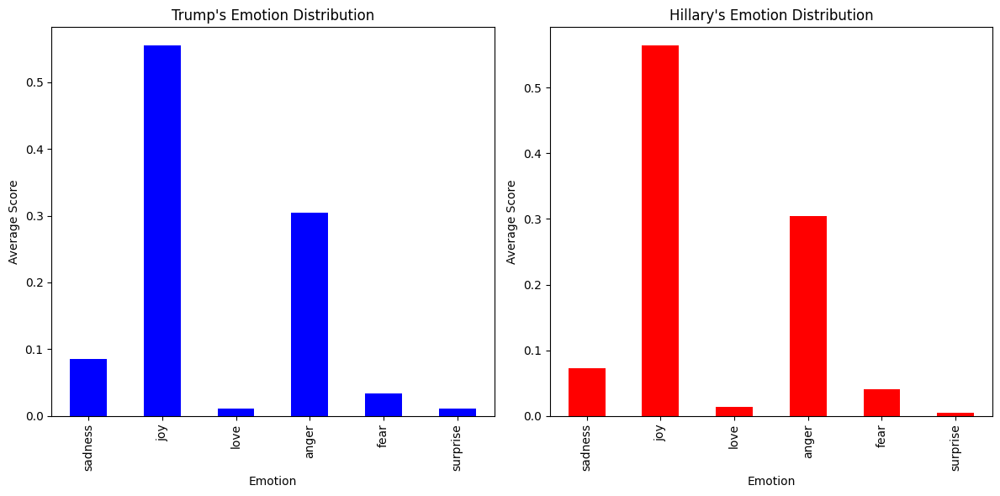

In [34]:
import pandas as pd
import matplotlib.pyplot as plt

# 将情感分数转换为DataFrame
def extract_emotion_scores(emotion_data):
    emotion_df = pd.DataFrame(emotion_data.tolist())
    return emotion_df

# 对特朗普和希拉里的情感数据进行转换
trump_emotions_df = extract_emotion_scores(trump_emotions)
hillary_emotions_df = extract_emotion_scores(hillary_emotions)

# 计算每种情感的平均值
trump_emotions_avg = trump_emotions_df.mean()
hillary_emotions_avg = hillary_emotions_df.mean()

# 可视化情感分布
plt.figure(figsize=(12, 6))

# Plot Trump emotions
plt.subplot(1, 2, 1)
trump_emotions_avg.plot(kind='bar', color='blue')
plt.title("Trump's Emotion Distribution")
plt.xlabel('Emotion')
plt.ylabel('Average Score')

# Plot Hillary emotions
plt.subplot(1, 2, 2)
hillary_emotions_avg.plot(kind='bar', color='red')
plt.title("Hillary's Emotion Distribution")
plt.xlabel('Emotion')
plt.ylabel('Average Score')

plt.tight_layout()
plt.show()

In [44]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# 将情感分数转换为DataFrame
def extract_emotion_scores(emotion_data):
    emotion_df = pd.DataFrame(emotion_data.tolist())
    return emotion_df

# 对特朗普和希拉里的情感数据进行转换
trump_emotions_df = extract_emotion_scores(trump_emotions)
hillary_emotions_df = extract_emotion_scores(hillary_emotions)

# 计算每种情感的平均值
trump_emotions_avg = trump_emotions_df.mean()
hillary_emotions_avg = hillary_emotions_df.mean()

# 创建交互式条形图
fig = go.Figure()

# 添加特朗普的情感条形图
fig.add_trace(go.Bar(
    x=trump_emotions_avg.index,
    y=trump_emotions_avg.values,
    name="Trump's Emotions",
    marker_color='blue'
))

# 添加希拉里的情感条形图
fig.add_trace(go.Bar(
    x=hillary_emotions_avg.index,
    y=hillary_emotions_avg.values,
    name="Hillary's Emotions",
    marker_color='red'
))

# 设置图表的布局
fig.update_layout(
    title="Trump vs. Hillary Emotion Distribution",
    xaxis_title="Emotion",
    yaxis_title="Average Score",
    barmode='group'
)

# 显示交互式图表
fig.show()

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


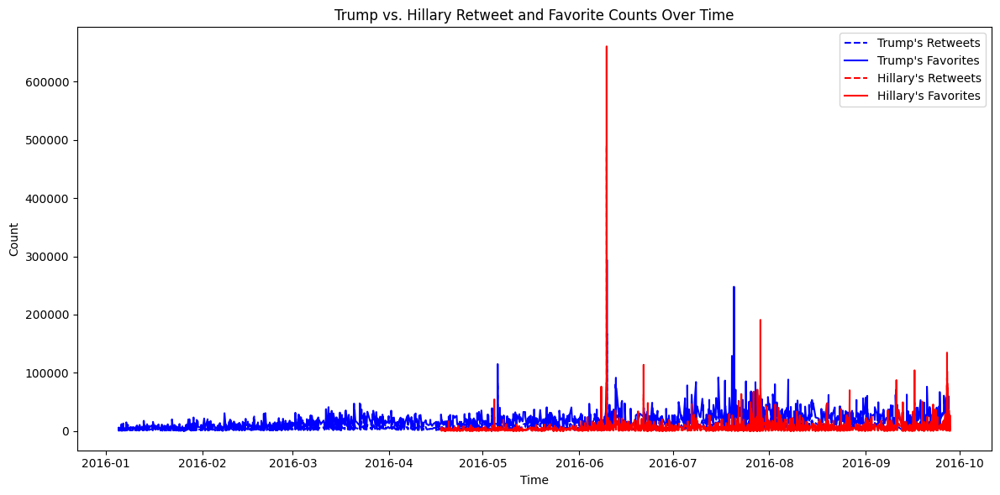

In [39]:
import matplotlib.pyplot as plt
import pandas as pd

# 假设 tweets DataFrame 中有 'handle', 'time', 'retweet_count', 'favorite_count' 列
# 'handle' 为推文发布者 (Trump 或 Hillary)
# 'time' 为推文发布的时间，确保其已经是 datetime 格式
tweets['time'] = pd.to_datetime(tweets['time'])

# 分别选择特朗普和希拉里的推文
trump_tweets = tweets[tweets['handle'] == 'realDonaldTrump']
hillary_tweets = tweets[tweets['handle'] == 'HillaryClinton']

# 设置图形大小
plt.figure(figsize=(12, 6))

# 绘制特朗普的点赞和转发数随时间变化的折线图
plt.plot(trump_tweets['time'], trump_tweets['retweet_count'], label="Trump's Retweets", color='blue', linestyle='--')
plt.plot(trump_tweets['time'], trump_tweets['favorite_count'], label="Trump's Favorites", color='blue')

# 绘制希拉里的点赞和转发数随时间变化的折线图
plt.plot(hillary_tweets['time'], hillary_tweets['retweet_count'], label="Hillary's Retweets", color='red', linestyle='--')
plt.plot(hillary_tweets['time'], hillary_tweets['favorite_count'], label="Hillary's Favorites", color='red')

# 设置图表标题和标签
plt.title('Trump vs. Hillary Retweet and Favorite Counts Over Time')
plt.xlabel('Time')
plt.ylabel('Count')

# 显示图例
plt.legend()

# 美化 x 轴的显示（旋转日期标签）
plt.xticks

# 显示图表
plt.tight_layout()
plt.show()

/var/folders/5h/b_ycf6fd2hx4kqysgjh3ly_80000gn/T/ipykernel_51958/2108576095.py:12: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  trump_daily = trump_tweets.resample('D', on='time').mean()
/var/folders/5h/b_ycf6fd2hx4kqysgjh3ly_80000gn/T/ipykernel_51958/2108576095.py:13: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  hillary_daily = hillary_tweets.resample('D', on='time').mean()


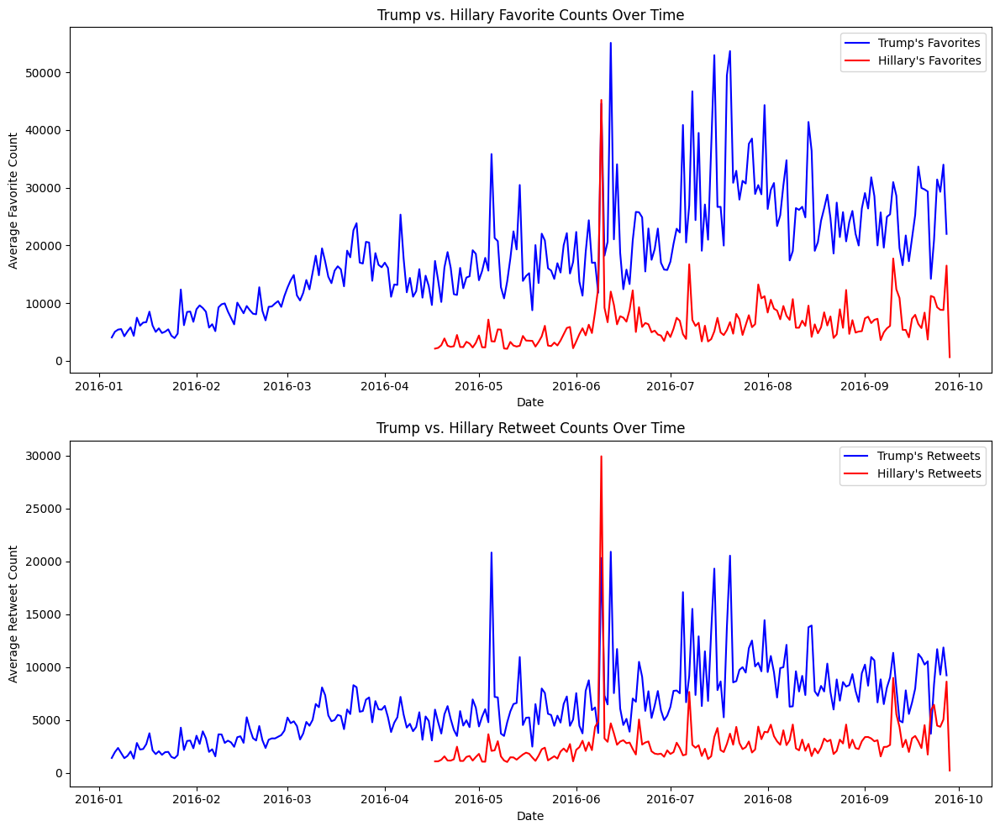

In [43]:
import matplotlib.pyplot as plt
import pandas as pd

# 确保 'time' 列是 datetime 格式
tweets['time'] = pd.to_datetime(tweets['time'])

# 分别选择特朗普和希拉里的推文
trump_tweets = tweets[tweets['handle'] == 'realDonaldTrump']
hillary_tweets = tweets[tweets['handle'] == 'HillaryClinton']

# 按天计算每天的点赞数和转发数的平均值
trump_daily = trump_tweets.resample('D', on='time').mean()
hillary_daily = hillary_tweets.resample('D', on='time').mean()

# 设置图形大小
plt.figure(figsize=(12, 10))

# 第一个图：点赞数趋势
plt.subplot(2, 1, 1)
plt.plot(trump_daily.index, trump_daily['favorite_count'], label="Trump's Favorites", color='blue')
plt.plot(hillary_daily.index, hillary_daily['favorite_count'], label="Hillary's Favorites", color='red')
plt.title('Trump vs. Hillary Favorite Counts Over Time')
plt.xlabel('Date')
plt.ylabel('Average Favorite Count')
plt.legend()
plt.xticks()

# 第二个图：转发数趋势
plt.subplot(2, 1, 2)
plt.plot(trump_daily.index, trump_daily['retweet_count'], label="Trump's Retweets", color='blue')
plt.plot(hillary_daily.index, hillary_daily['retweet_count'], label="Hillary's Retweets", color='red')
plt.title('Trump vs. Hillary Retweet Counts Over Time')
plt.xlabel('Date')
plt.ylabel('Average Retweet Count')
plt.legend()
plt.xticks()

plt.tight_layout()
plt.show()

In [35]:
from transformers import AutoTokenizer, TFAutoModelForSequenceClassification, pipeline

# 选择模型，使用 GoEmotions 模型
model_name = "bhadresh-savani/distilbert-base-uncased-emotion"

# 加载 AutoTokenizer 和 AutoModelForSequenceClassification
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = TFAutoModelForSequenceClassification.from_pretrained(model_name)

# 创建情感分析 pipeline
emotion_classifier = pipeline("text-classification", model=model, tokenizer=tokenizer, return_all_scores=True)

# 定义函数对推文进行情感分析
def analyze_emotions(text):
    inputs = tokenizer(text, return_tensors="tf")  # 使用AutoTokenizer进行文本编码
    outputs = model(**inputs)                      # 通过模型获取输出
    scores = emotion_classifier(text)              # 结合pipeline进行详细的情感分类
    return scores

# 示例推文
text = "I am so happy and excited about this new project!"

# 分析情感
emotion_scores = analyze_emotions(text)
print(emotion_scores)

All PyTorch model weights were used when initializing TFDistilBertForSequenceClassification.

All the weights of TFDistilBertForSequenceClassification were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertForSequenceClassification for predictions without further training.


[[{'label': 'sadness', 'score': 0.000234190360060893}, {'label': 'joy', 'score': 0.9988635778427124}, {'label': 'love', 'score': 0.00030361476819962263}, {'label': 'anger', 'score': 0.00022524615633301437}, {'label': 'fear', 'score': 0.0001741414307616651}, {'label': 'surprise', 'score': 0.00019917829195037484}]]


/Users/yukiding/anaconda3/lib/python3.11/site-packages/transformers/pipelines/text_classification.py:105: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(


In [30]:
from transformers import TFAutoModelForSequenceClassification, AutoTokenizer, pipeline

# 加载 GoEmotions 模型的 TensorFlow 版本
tokenizer = AutoTokenizer.from_pretrained("bhadresh-savani/distilbert-base-uncased-emotion")
model = TFAutoModelForSequenceClassification.from_pretrained("bhadresh-savani/distilbert-base-uncased-emotion")

# 创建情感分析器
emotion_classifier = pipeline("text-classification", model=model, tokenizer=tokenizer, return_all_scores=True)

All PyTorch model weights were used when initializing TFDistilBertForSequenceClassification.

All the weights of TFDistilBertForSequenceClassification were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertForSequenceClassification for predictions without further training.
/Users/yukiding/anaconda3/lib/python3.11/site-packages/transformers/pipelines/text_classification.py:105: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(


In [31]:
# 对每一条推文进行细粒度情感分析
tweets_emotion = tweets.apply(lambda x: emotion_classifier(x)[0])

# 将每条推文的情感得分和标签提取出来
emotion_data = []

for result in tweets_emotion:
    emotion_dict = {item['label']: item['score'] for item in result}
    emotion_data.append(emotion_dict)

# 转换为 DataFrame
emotion_df = pd.DataFrame(emotion_data)

# 查看数据
print(emotion_df.head())

ValueError: text input must of type `str` (single example), `List[str]` (batch or single pretokenized example) or `List[List[str]]` (batch of pretokenized examples).

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# 对情感分布进行可视化
def plot_emotion_distribution(emotion_df):
    # 统计每种情感的平均得分
    avg_emotions = emotion_df.mean().sort_values(ascending=False)

    plt.figure(figsize=(10, 6))
    sns.barplot(x=avg_emotions.index, y=avg_emotions.values, palette='viridis')
    plt.title("Emotion Distribution")
    plt.xlabel("Emotion")
    plt.ylabel("Average Score")
    plt.xticks(rotation=0)
    plt.show()

# 调用函数，生成情感分布图
plot_emotion_distribution(emotion_df)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 将 Series 转换为 DataFrame
tweets_df = pd.DataFrame(tweets_sentiment.tolist())

# 查看 DataFrame 的前几行
print(tweets_df.head())

# 画情感分布的条形图
def plot_sentiment_distribution(sentiment_data):
    sentiment_counts = sentiment_data['label'].value_counts()
    plt.figure(figsize=(10, 6))
    sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values, palette='viridis')
    plt.title("Sentiment Distribution")
    plt.xlabel("Sentiment")
    plt.ylabel("Count")
    plt.show()

# 调用函数，生成情感分布图
plot_sentiment_distribution(tweets_df)

In [ ]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from collections import Counter

# Download required NLTK resources
nltk.download('punkt')
nltk.download('stopwords')

# Text preprocessing function
def preprocess_text(text):
    # Convert to lowercase
    text = text.lower()
    # Remove URLs and special characters
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'\@\w+|\#','', text)  # Remove @mentions and #hashtags
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    # Tokenization
    words = word_tokenize(text)
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if word not in stop_words]
    return words

# Apply preprocessing to all tweets
cleaned_tweets = tweets.apply(preprocess_text)

# Flatten the list of words for frequency analysis
all_words = [word for tweet in cleaned_tweets for word in tweet]

# Perform word frequency analysis
word_freq = Counter(all_words)

# Display the most common words
word_freq.most_common(10)

In [ ]:
from nltk.sentiment import SentimentIntensityAnalyzer
import nltk
nltk.download('vader_lexicon')

# 创建情感分析器对象
sia = SentimentIntensityAnalyzer()

# 对推文进行情感分析，获取情感得分
def analyze_sentiment(text):
    return sia.polarity_scores(text)

# 将情感分析应用于每一条推文
tweets_sentiment = tweets.apply(analyze_sentiment)

# 查看前几条推文的情感得分
tweets_sentiment.head()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 将 compound 情感得分提取出来
tweets_sentiment_compound = tweets_sentiment.apply(lambda x: x['compound'])

# 绘制情感得分的分布
plt.figure(figsize=(8, 6))
sns.histplot(tweets_sentiment_compound, kde=True, bins=30)
plt.title('Distribution of Sentiment Scores (Compound)')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.show()

In [ ]:
from textblob import TextBlob

# 对每一条推文进行情感分析
def analyze_textblob_sentiment(text):
    analysis = TextBlob(text)
    return {'polarity': analysis.sentiment.polarity, 'subjectivity': analysis.sentiment.subjectivity}

# 将 TextBlob 分析应用于每一条推文
tweets_sentiment = tweets.apply(analyze_textblob_sentiment)

# 查看前几条推文的情感得分
tweets_sentiment.head()

In [38]:
from transformers import pipeline

# 加载预训练的情感分析模型
classifier = pipeline("sentiment-analysis")

# 对每一条推文进行情感分析
tweets_sentiment = tweets.apply(lambda x: classifier(x)[0])

# 查看前几条推文的情感分析结果
tweets_sentiment.head()

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.
All PyTorch model weights were used when initializing TFDistilBertForSequenceClassification.

All the weights of TFDistilBertForSequenceClassification were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertForSequenceClassification for predictions without further training.


Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/Users/yukiding/anaconda3/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3526, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/5h/b_ycf6fd2hx4kqysgjh3ly_80000gn/T/ipykernel_50710/1163860102.py", line 7, in <module>
    tweets_sentiment = tweets.apply(lambda x: classifier(x)[0])
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/yukiding/anaconda3/lib/python3.11/site-packages/pandas/core/series.py", line 4771, in apply
    return SeriesApply(self, func, convert_dtype, args, kwargs).apply()
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/yukiding/anaconda3/lib/python3.11/site-packages/pandas/core/apply.py", line 1123, in apply
    return self.apply_standard()
           ^^^^^^^^^^^^^^^^^^^^^
  File "/Users/yukiding/anaconda3/lib/python3.11/site-packages/pandas/core/apply.py", line 1174, in apply_standard
    mapped = li

In [ ]:
print(tweets_sentiment.head())

In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from gensim import corpora
from gensim.models import LdaModel
import string

# 下载需要的资源
nltk.download('punkt')
nltk.download('stopwords')

# 准备停用词和标点符号
stop_words = set(stopwords.words('english'))
punctuation = string.punctuation

# 预处理函数
def preprocess_text(text):
    # 分词
    words = word_tokenize(text.lower())
    # 去除停用词和标点符号
    words = [word for word in words if word not in stop_words and word not in punctuation]
    return words

# 对所有推文应用预处理
processed_texts = tweets.apply(preprocess_text)

# 创建词典和语料库
dictionary = corpora.Dictionary(processed_texts)
corpus = [dictionary.doc2bow(text) for text in processed_texts]

# 训练LDA模型，设定主题数（例如5个主题）
lda_model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=5, random_state=42)

# 展示每个主题的关键词
topics = lda_model.print_topics(num_words=5)
for idx, topic in topics:
    print(f"Topic {idx}: {topic}")

# 分析每段文本的主题
def get_topics(text, lda_model, dictionary):
    bow = dictionary.doc2bow(preprocess_text(text))
    topics = lda_model.get_document_topics(bow)
    return topics

# 获取每条推文的主题分布
tweets_topics = tweets.apply(lambda x: get_topics(x, lda_model, dictionary))

# 打印每条推文的主题分布
print(tweets_topics.head())